In [ ]:
# # ================= 0. 设置库和路径 =================
# library(ggplot2)
# library(dplyr)
# library(viridis)
# library(gridExtra)
# library(cowplot)
# library(stringr)

# # 输入路径
# enrichment_dir <- "/data/work/02.result/colocalization_20251226/py" # 你的 enrichment.csv 所在路径
# meta_dir <- "/data/work/02.result/colocalization_20251226/sp_meta"    # 你的空间坐标 meta 所在路径
# output_dir <- "/data/work/02.result/colocalization_20251226/plots"  # 结果保存路径

# if(!dir.exists(output_dir)) dir.create(output_dir, recursive = TRUE)
# setwd(output_dir)

# # 定义黑色背景主题 (参考你的提供的 white_theme 函数，但实际是黑色背景)
# black_theme <- function() {
#   theme(
#     panel.background = element_rect(fill = "black", color = NA),
#     plot.background = element_rect(fill = "black", color = "black"),
#     legend.background = element_rect(fill = "black"),
#     legend.box.background = element_rect(fill = "black", color = NA),
#     panel.grid = element_blank(),
#     axis.line = element_line(linewidth = 0.5, color = "white"),
#     axis.text = element_text(size = 12, color = "white"),
#     axis.title = element_text(size = 14, color = "white"),
#     legend.title = element_text(size = 12, color = "white"),
#     legend.text = element_text(size = 10, color = "white"),
#     plot.title = element_text(size = 16, color = "white", hjust = 0.5),
#     legend.position = "right",
#     legend.key = element_rect(fill = "black", color = NA)
#   )
# }

# # ================= 1. 批量绘制气泡图 (Bubble Plot) =================
# # 逻辑：循环读取每一个 enrichment.csv 并出图

# enrich_files <- list.files(enrichment_dir, pattern = "_enrichment.csv", full.names = TRUE)

# message(paste("找到", length(enrich_files), "个富集分析文件，开始绘制气泡图..."))

# for (file in enrich_files) {
  
#   # 1. 读取数据
#   df <- read.csv(file, row.names = 1, stringsAsFactors = FALSE)
  
#   # 获取 Sample ID (例如 M1_D14)
#   fn <- basename(file)
#   sample_id <- str_remove(fn, "_enrichment.csv")
  
#   # 2. 数据清洗 (和 Python 逻辑一致)
#   # 处理 Log2FC 的极值，防止颜色溢出
#   # 将 Log2FC 截断在 -3 到 3 之间 (可根据需要调整)
#   df$Log2FC[df$Log2FC > 3] <- 3
#   df$Log2FC[df$Log2FC < -3] <- -3
  
#   # 计算 -log10 Pvalue
#   # 加上极小值防止报错
#   df$neglogP <- -log10(df$Pvalue + 1e-300)
#   # 截断 P值显示上限，防止点过大
#   df$neglogP[df$neglogP > 20] <- 20 
  
#   # 3. 过滤 (可选)
#   # 为了图表清晰，这里只展示 P < 0.05 的点，或者 Log2FC 绝对值大于 0.5 的点
#   # 你可以注释掉下面这行来展示所有点
#   plot_df <- df %>% filter(Pvalue < 0.05)
  
#   if (nrow(plot_df) == 0) {
#     message(paste("  ->", sample_id, "没有显著结果，跳过。"))
#     next
#   }
  
#   # 4. 绘图
#   p <- ggplot(plot_df, aes(x = To, y = From, color = Log2FC, size = neglogP)) + 
#     geom_point() + 
#     scale_color_viridis(option = "B", begin = 0.1, end = 0.9, limits=c(-3, 3)) + # 使用 viridis B (Inferno变体)
#     theme_bw() +
#     labs(title = paste("Spatial Enrichment:", sample_id), 
#          x = "Neighbor Cell Type", y = "Center Cell Type",
#          color = "Log2FC", size = "-log10(P)") +
#     theme(
#       axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)
#     ) +
#     black_theme() # 应用黑色主题
  
#   # 保存 PDF
#   ggsave(plot = p, filename = paste0(sample_id, "_Bubble_BlackTheme.pdf"), 
#          width = 8, height = 6)
  
#   message(paste("  ->", sample_id, "气泡图已保存。"))
# }


# # ================= 2. 绘制空间密度轮廓图 (Contour Plot) =================
# # 逻辑：需要指定你想看哪两个细胞在哪个样本里的共定位

# # # !!! 请在这里修改你想展示的样本和细胞对 !!!
# # # 这是一个列表，名字是 SampleID，内容是向量 c(细胞类型A, 细胞类型B)
# # # 必须确保细胞类型名称与 pred_celltype 列中的名称完全一致
# # target_list <- list(
# #   "M1_D14" = c("AntiInfMacr", "FB"),      # 示例：在 M1_D14 中看 抗炎巨噬细胞 vs 成纤维
# #   "M1_D3"  = c("Bas-I", "Bas-inflamed")   # 示例
# #   # 你可以继续添加...
# # )



# # 颜色设置 (你需要确保这里有足够的颜色，或者读取你的 color.csv)
# # 这里我生成一个临时的颜色向量供演示
# all_celltypes <- unique(unlist(target_list))
# my_colors <- rainbow(length(all_celltypes))
# names(my_colors) <- all_celltypes
# # 如果你有固定的颜色文件，请取消注释并读取：
# # co = read.csv("/path/to/color_for_cellchat.csv")
# # my_colors = co$color
# # names(my_colors) = co$celltype


# message("\n开始绘制空间密度轮廓图...")

# for (stage in names(target_list)) {
  
#   # 1. 匹配 Meta 文件
#   # 假设文件名格式 M1_D14-anno_meta.csv
#   meta_file <- list.files(meta_dir, pattern = paste0(stage, ".*_meta.csv"), full.names = TRUE)
  
#   if (length(meta_file) == 0) {
#     warning(paste("未找到样本", stage, "的 metadata 文件"))
#     next
#   }
  
#   # 2. 读取坐标和注释
#   # 注意：你的 meta 文件里已经有 x_adjust, y_adjust 和 pred_celltype，直接用即可
#   meta_df <- read.csv(meta_file[1], row.names = 1, stringsAsFactors = FALSE)
  
#   # 提取绘图所需数据
#   coord <- data.frame(
#     x = meta_df$x_adjust,
#     y = meta_df$y_adjust,
#     celltype = meta_df$pred_celltype
#   )
  
#   # 获取当前要对比的两个细胞
#   ct1 <- target_list[[stage]][1]
#   ct2 <- target_list[[stage]][2]
  
#   # 检查细胞类型是否存在
#   if (!(ct1 %in% unique(coord$celltype)) | !(ct2 %in% unique(coord$celltype))) {
#     warning(paste("样本", stage, "中未找到指定的细胞类型:", ct1, "或", ct2))
#     next
#   }
  
#   message(paste("  -> 正在绘制:", stage, "|", ct1, "vs", ct2))

#   # 3. 绘图函数 (左图)
#   p1 <- ggplot(coord, aes(x = x, y = y)) +
#     # 背景点：画所有细胞，灰色，非常小
#     geom_point(color = "#333333", size = 0.1, alpha = 0.3) + 
#     # 目标点：画 ct1 细胞
#     geom_point(data = coord[coord$celltype == ct1, ], aes(color = celltype), size = 0.5) +
#     # 密度图：填充
#     geom_density_2d_filled(data = coord[coord$celltype == ct1, ], 
#                            aes(x=x, y=y), alpha = 0.4, bins = 6, show.legend = FALSE) +
#     # 密度线
#     geom_density_2d(data = coord[coord$celltype == ct1, ], 
#                     aes(x=x, y=y), color = "white", linewidth = 0.2, bins = 6) +
#     coord_fixed() +
#     theme_bw() +
#     labs(title = paste(stage, "-", ct1)) +
#     black_theme() +
#     theme(legend.position = "none") # 隐藏图例保持简洁

#   # 4. 绘图函数 (右图)
#   p2 <- ggplot(coord, aes(x = x, y = y)) +
#     geom_point(color = "#333333", size = 0.1, alpha = 0.3) + 
#     geom_point(data = coord[coord$celltype == ct2, ], aes(color = celltype), size = 0.5) +
#     # 这里为了区分，右图用不同的 viridis 色盘做密度背景
#     geom_density_2d_filled(data = coord[coord$celltype == ct2, ], 
#                            aes(x=x, y=y), alpha = 0.4, bins = 6, show.legend = FALSE) +
#     # 强制修改 filled 的填充色可能比较复杂，这里默认使用 viridis
#     geom_density_2d(data = coord[coord$celltype == ct2, ], 
#                     aes(x=x, y=y), color = "red", linewidth = 0.2, bins = 6) +
#     coord_fixed() +
#     theme_bw() +
#     labs(title = paste(stage, "-", ct2)) +
#     black_theme() +
#     theme(legend.position = "none")

#   # 5. 组合图片
#   g <- grid.arrange(p1, p2, nrow = 1)
  
#   # 加一个纯黑背景
#   p_final <- cowplot::ggdraw(g) + 
#     theme(plot.background = element_rect(fill = "black", color = NA))
  
#   # 保存
#   ggsave(plot = p_final, 
#          filename = paste0(stage, "_Contour_", ct1, "_vs_", ct2, ".pdf"), 
#          width = 12, height = 6)
# }

# message("所有图片处理完毕！")

## 暴力 使用 combn 函数生成所有可能的两两组合 看 每张芯片所有细胞类型两两间的互作


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: viridisLite


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


>>> PART 1: 开始绘制气泡图...

  -> [完成] M1_D14 气泡图

  -> [完成] M1_D21 气泡图

  -> [完成] M1_D3 气泡图

  -> [完成] M1_D7 气泡图

  -> [完成] M2_D14 气泡图

  -> [完成] M2_D21 气泡图

  -> [完成] M2_D3 气泡图

  -> [完成] M2_D7 气泡图

  -> [完成] M4_D14 气泡图

  -> [完成] M4_D21 气泡图

  -> [完成] M4_D3 气泡图

  -> [完成] M4_D7 气泡图


>>> PART 2: 开始绘制全排列空间密度轮廓图...

正在处理芯片: M1_D14

  -> 有效细胞类型: 38 | 组合总数: 703

Warning message:
“The dot-dot notation (`..level..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(level)` instead.”


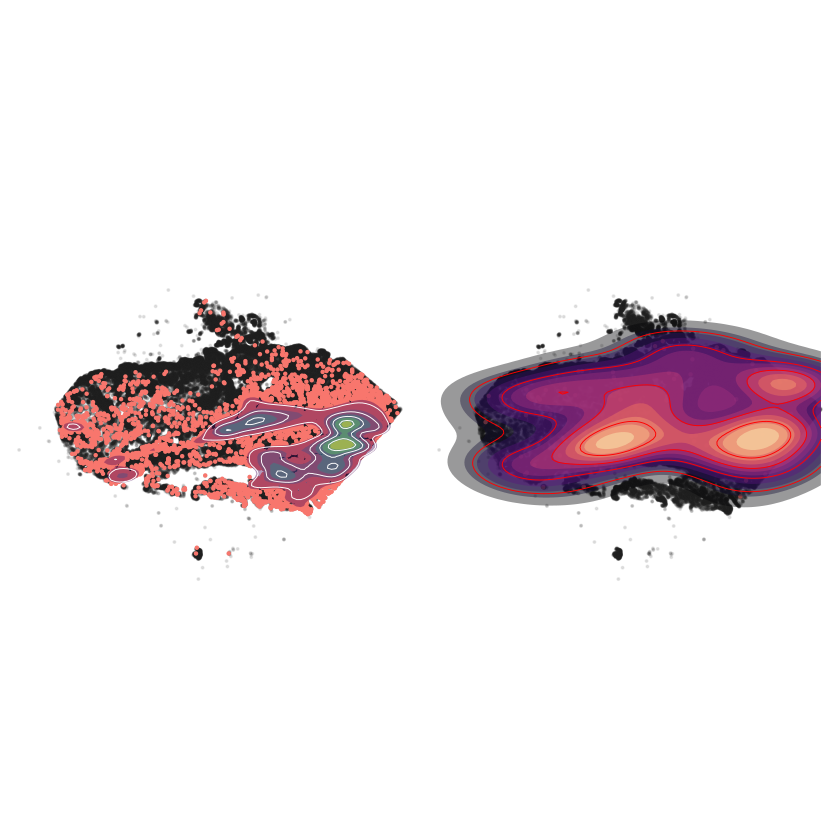

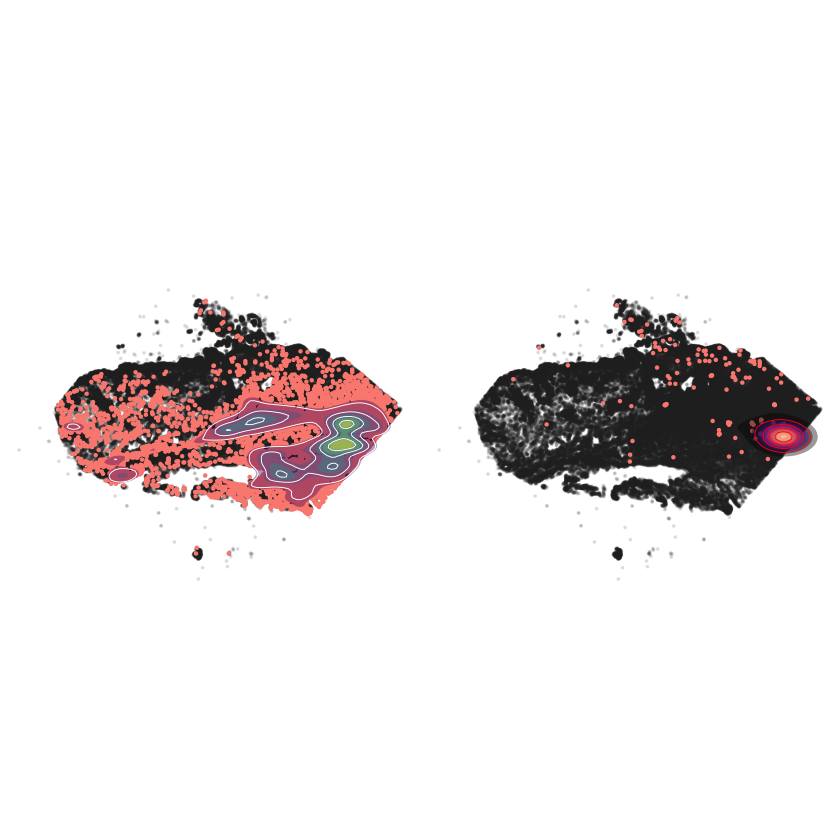

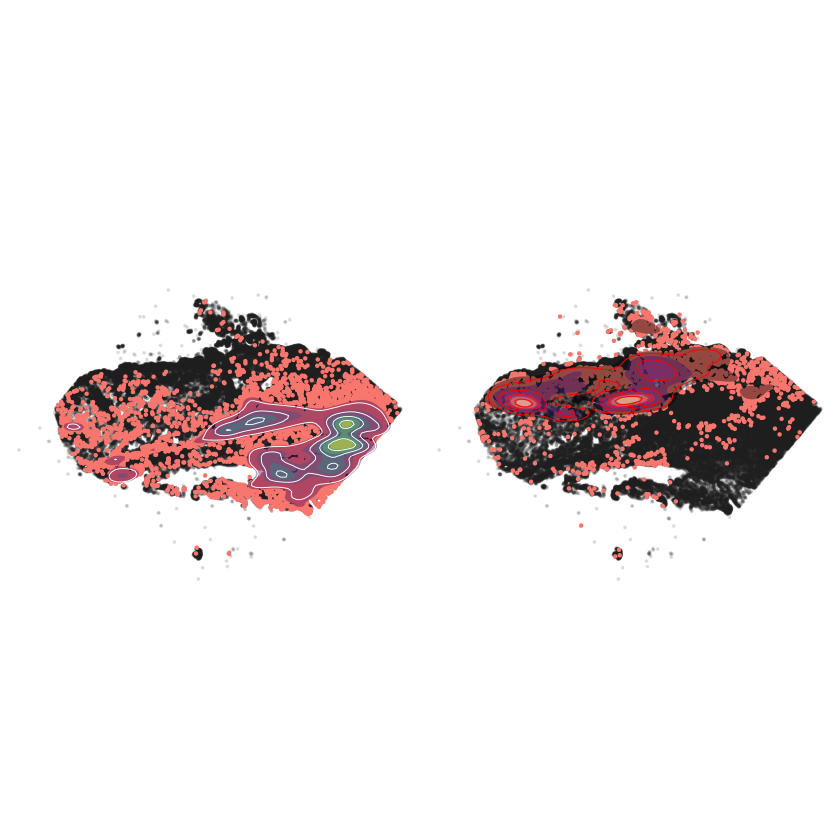

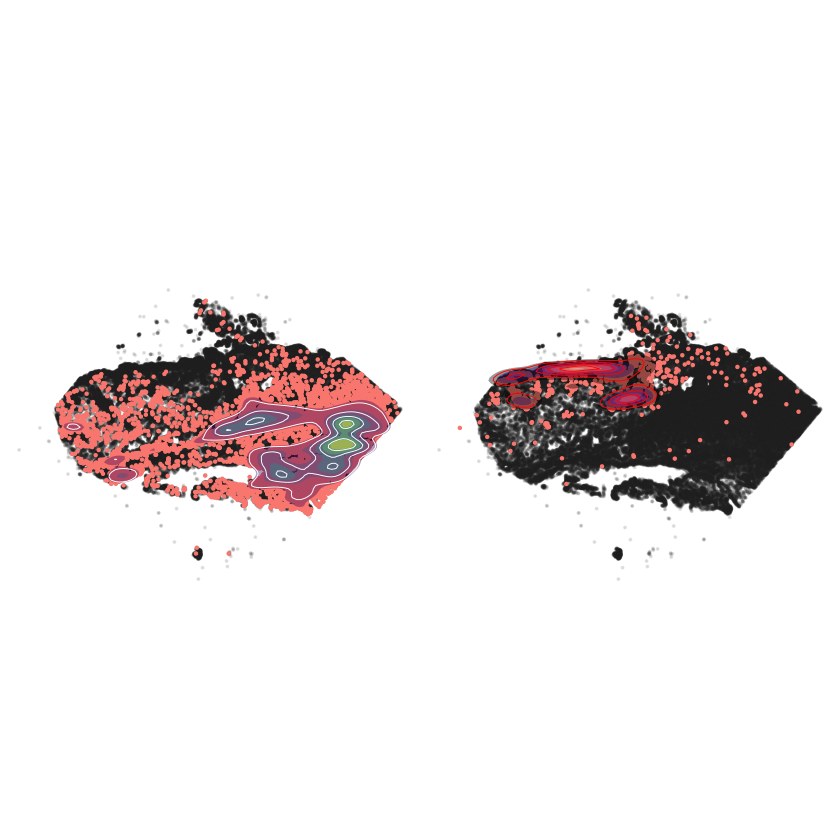

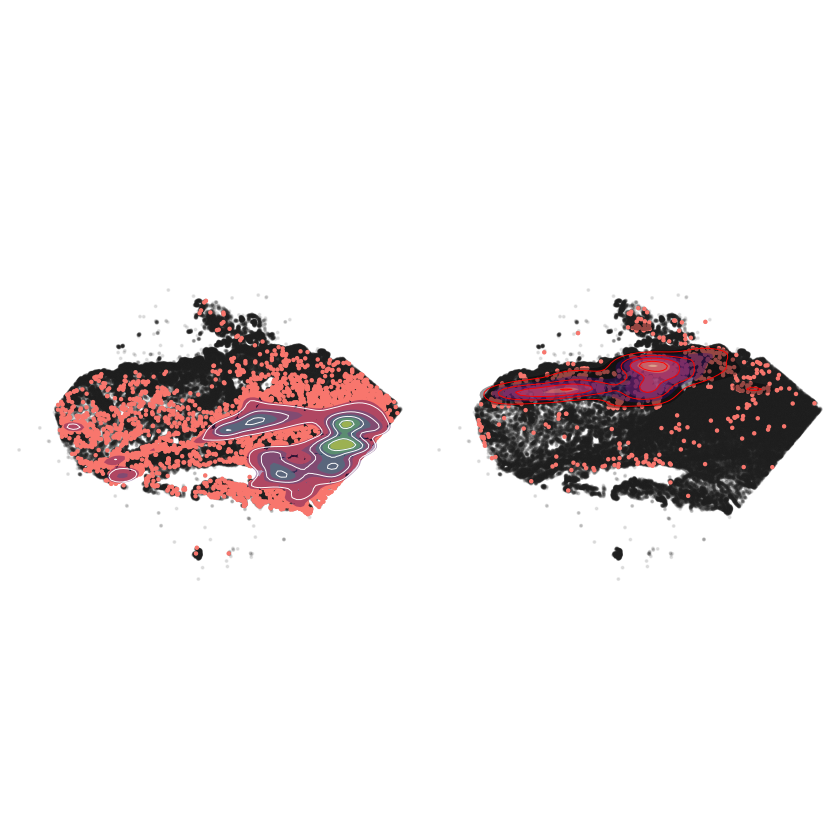

...

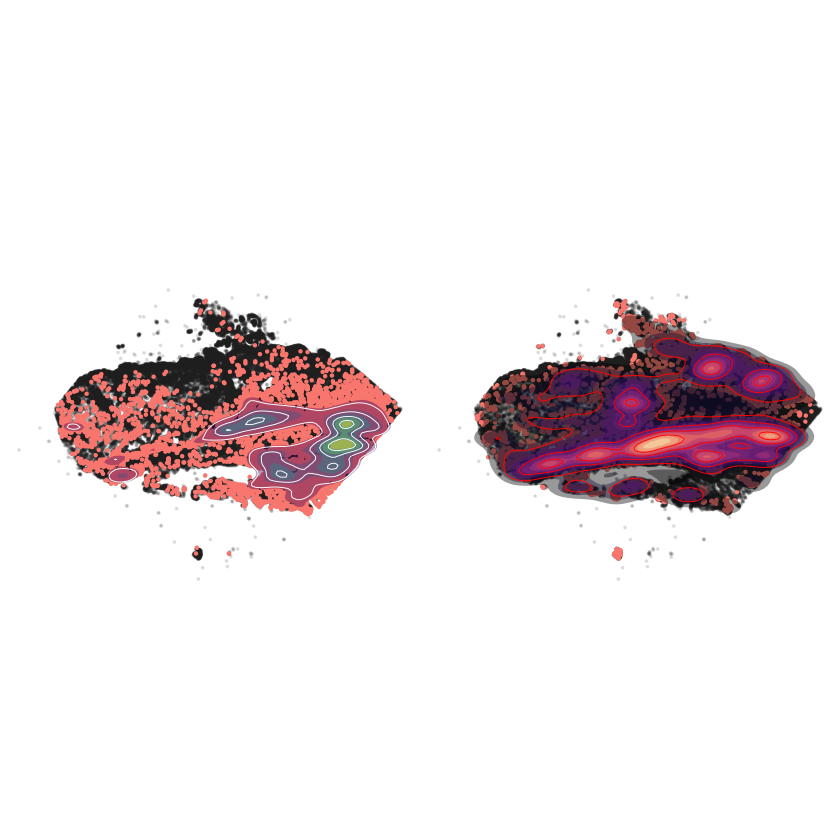

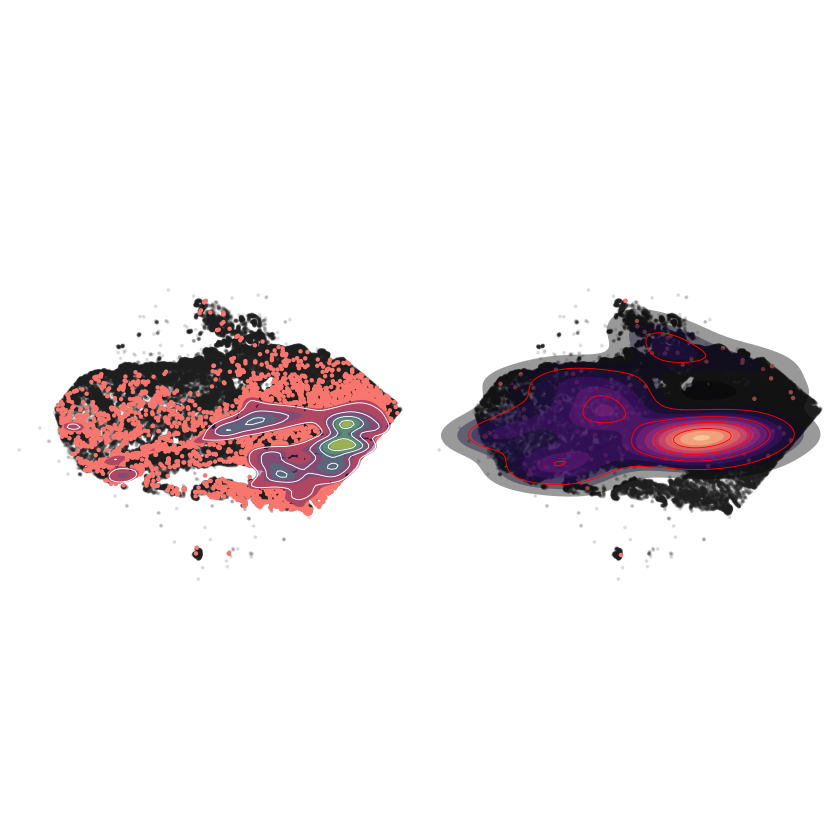

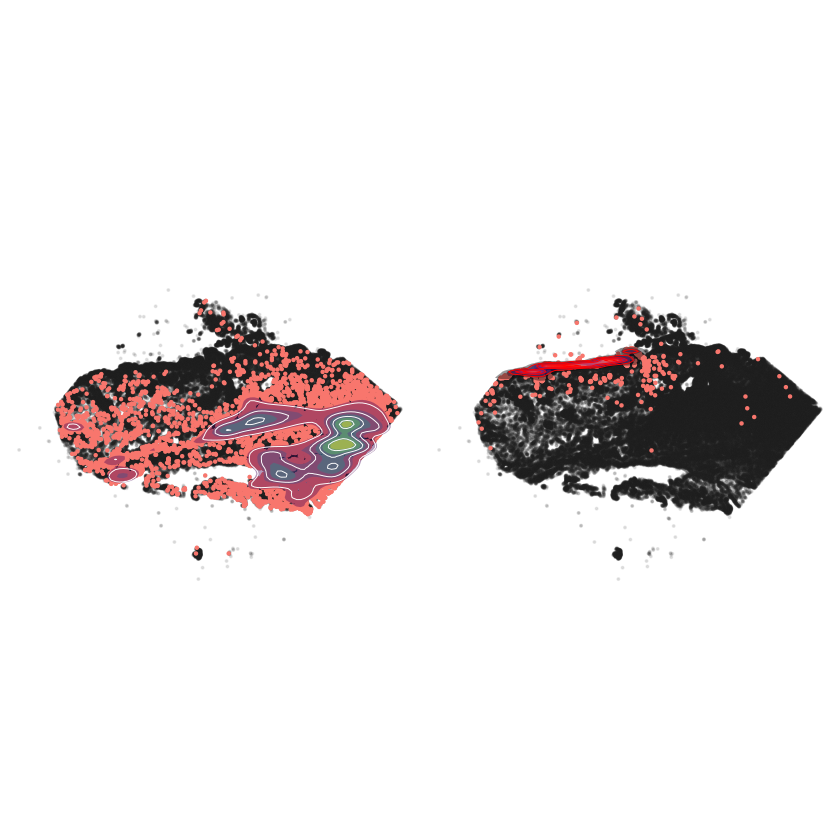

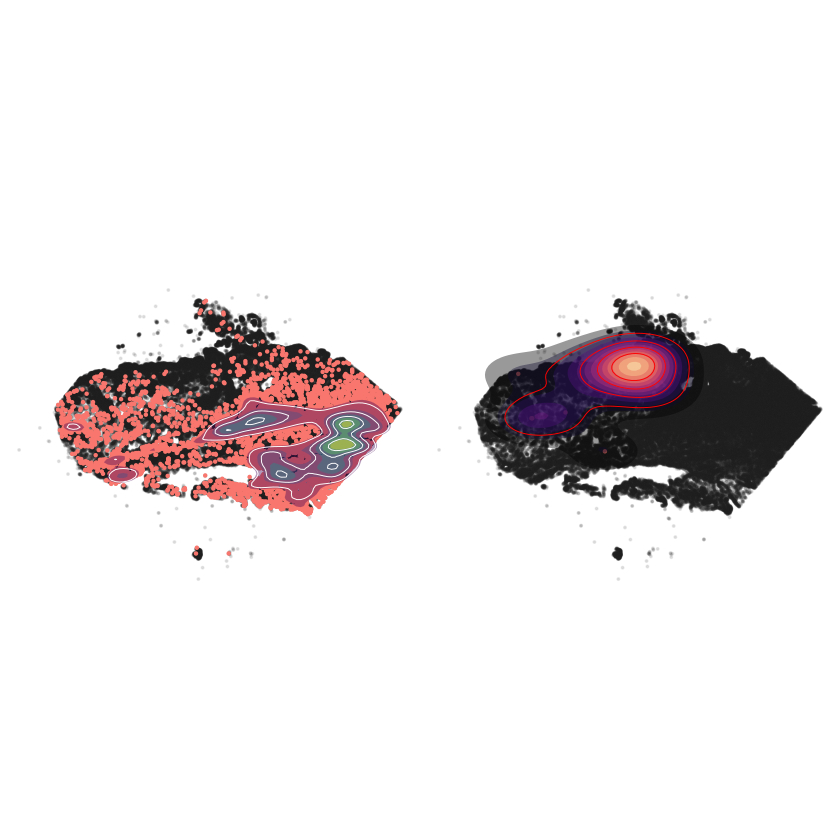

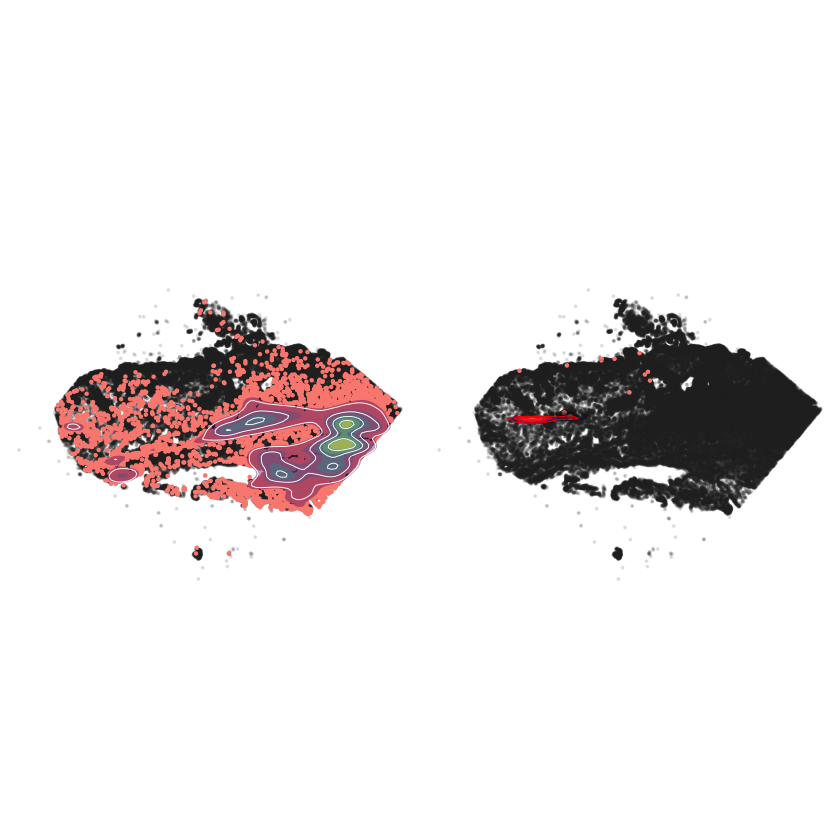

     进度: 20 / 703



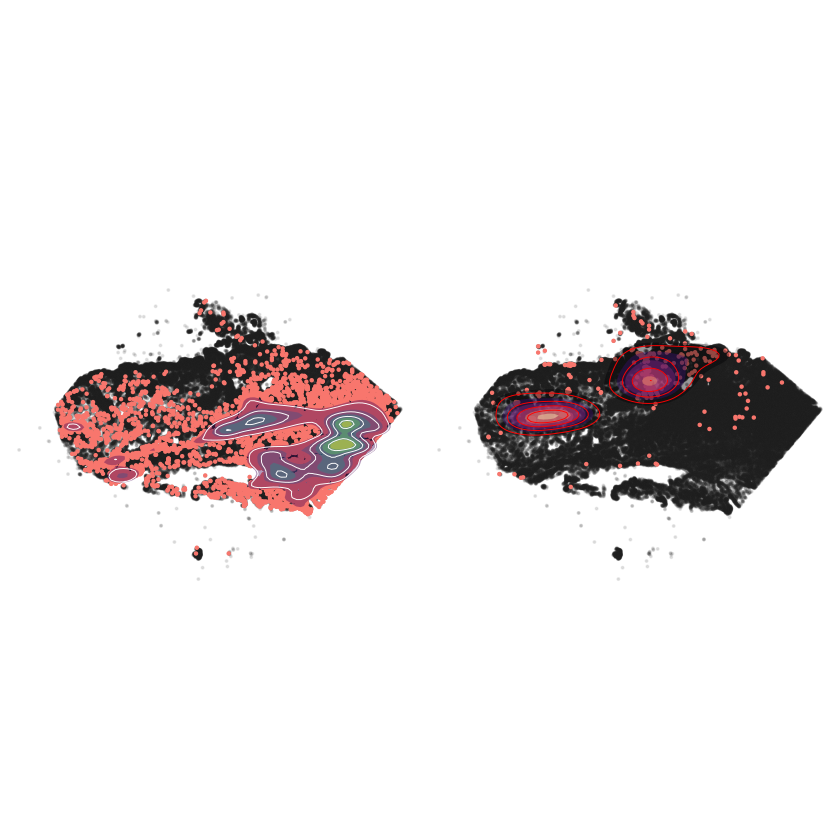

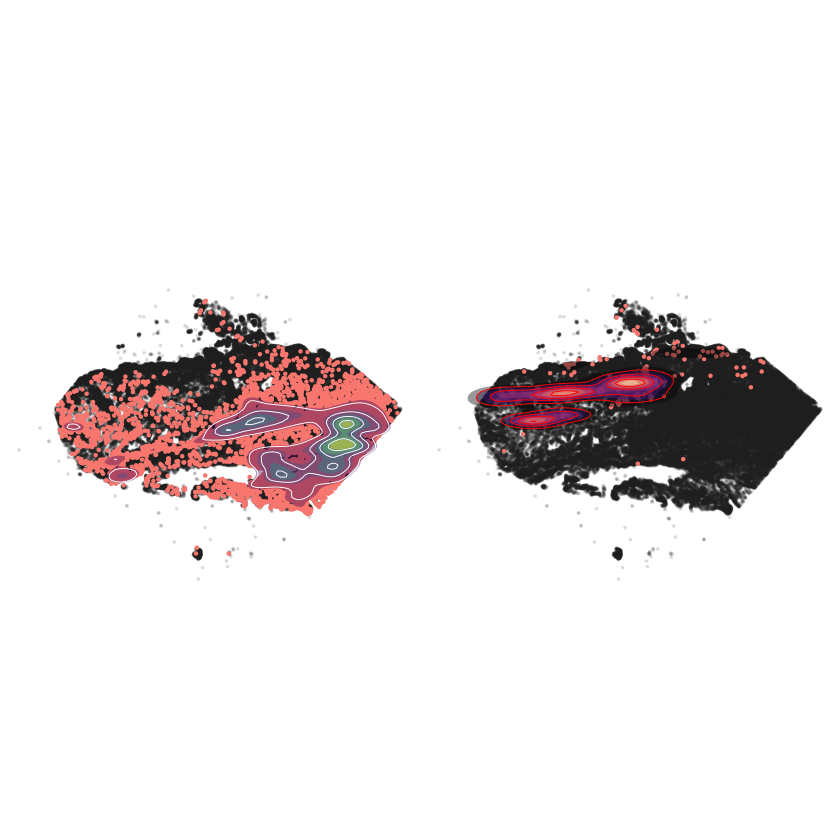

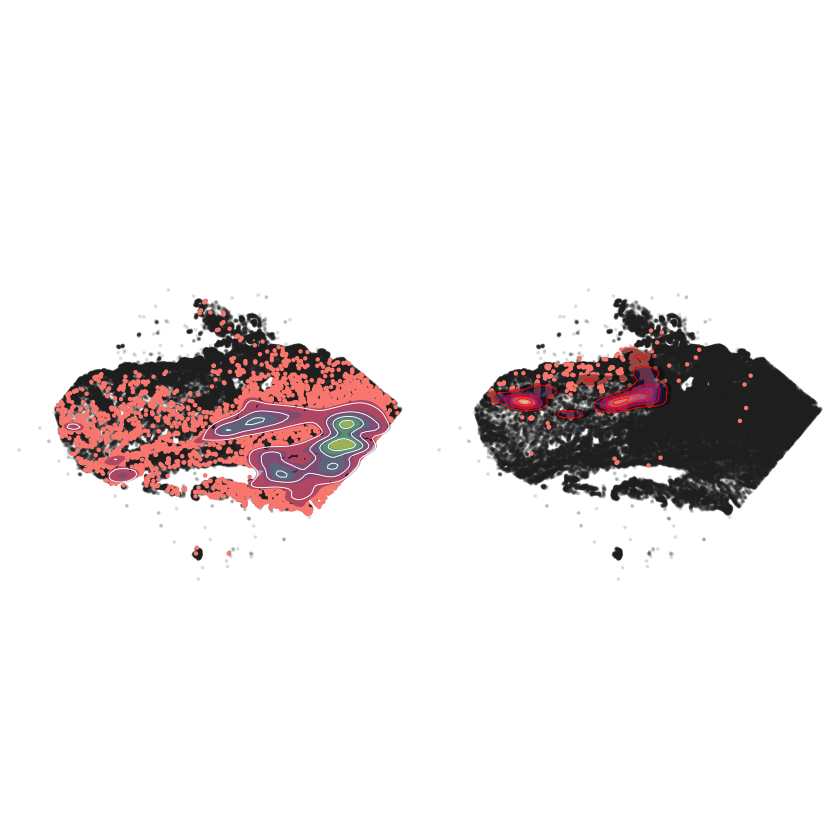

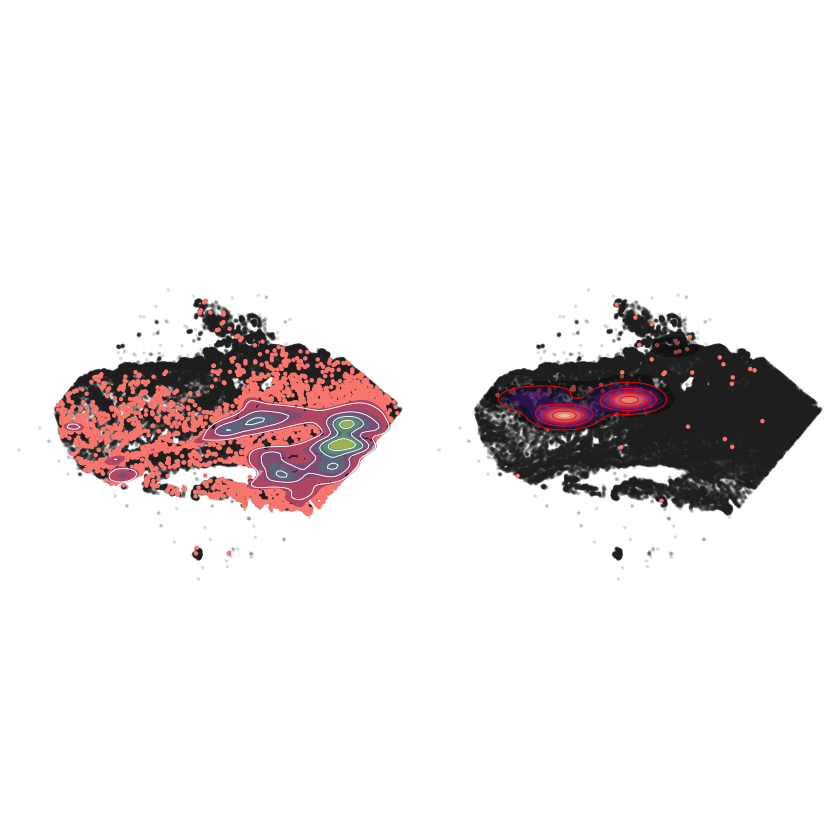

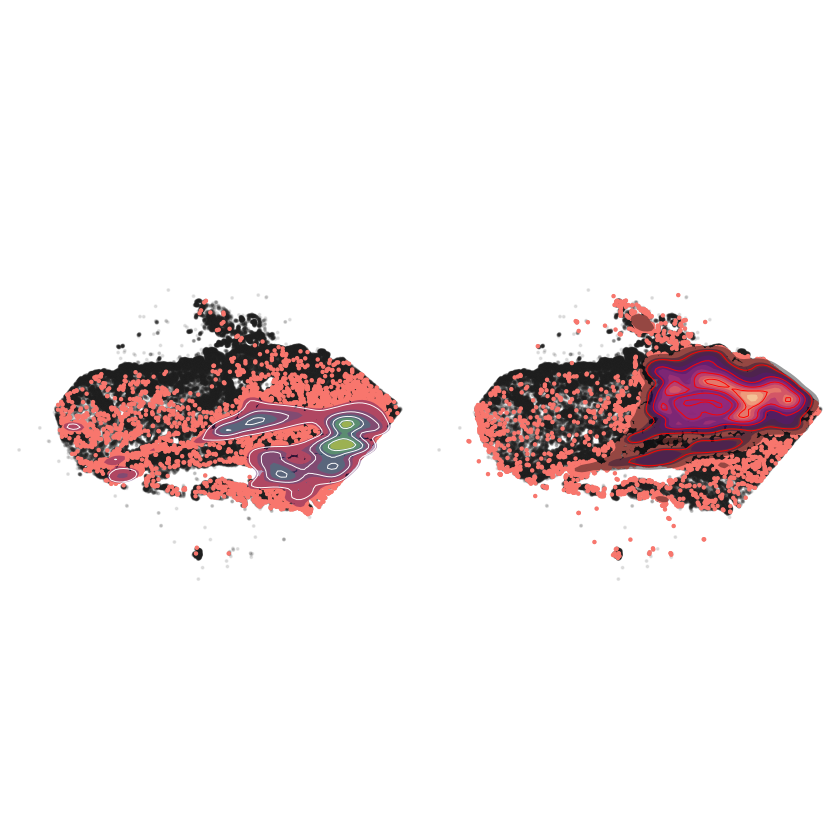

...

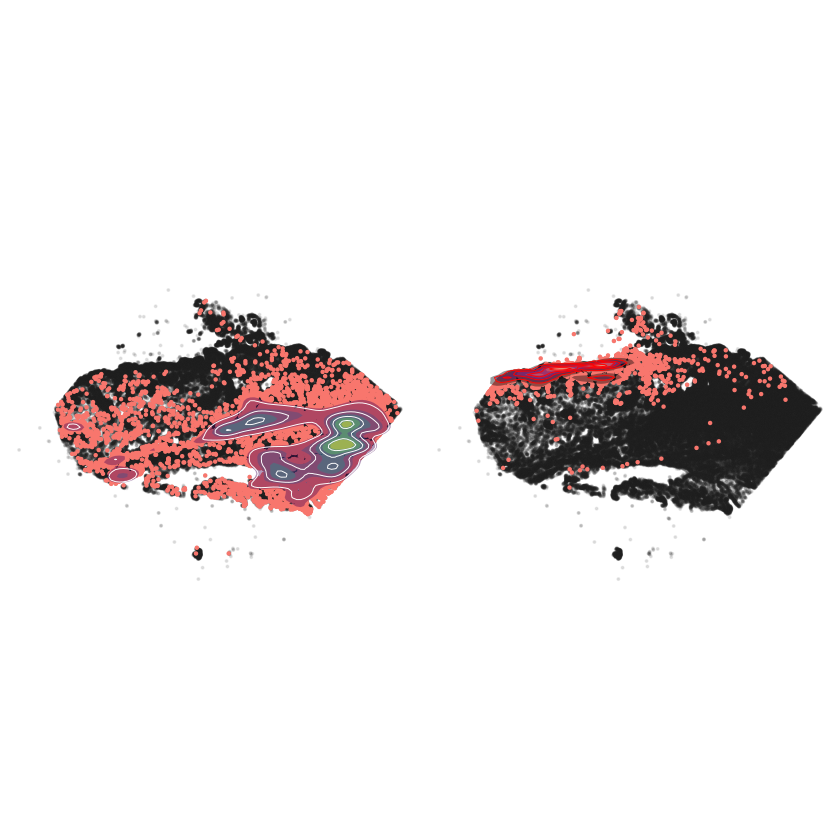

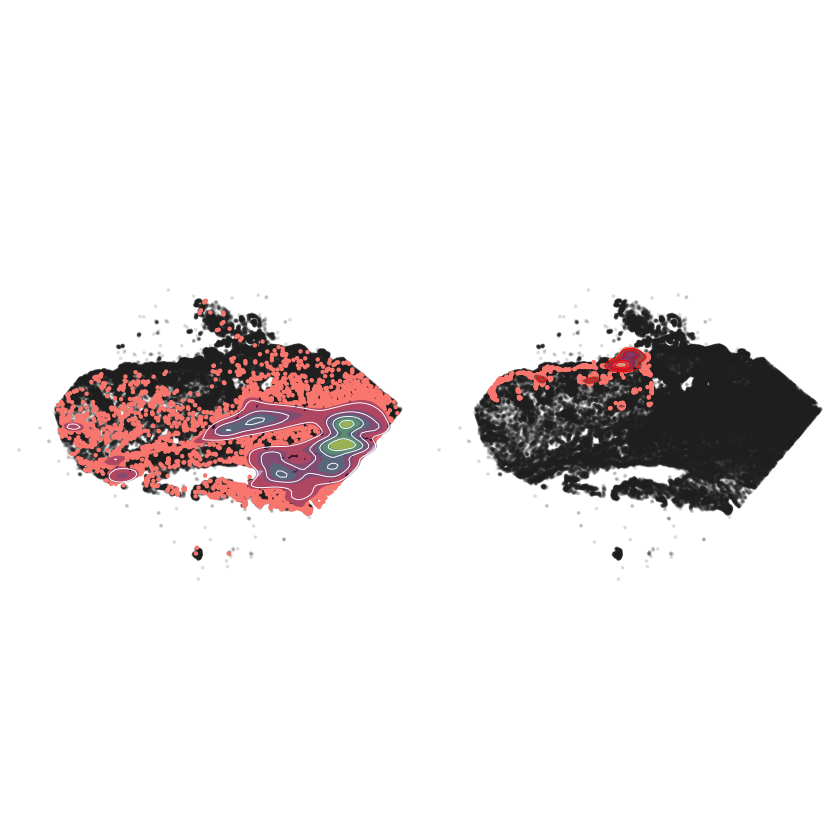

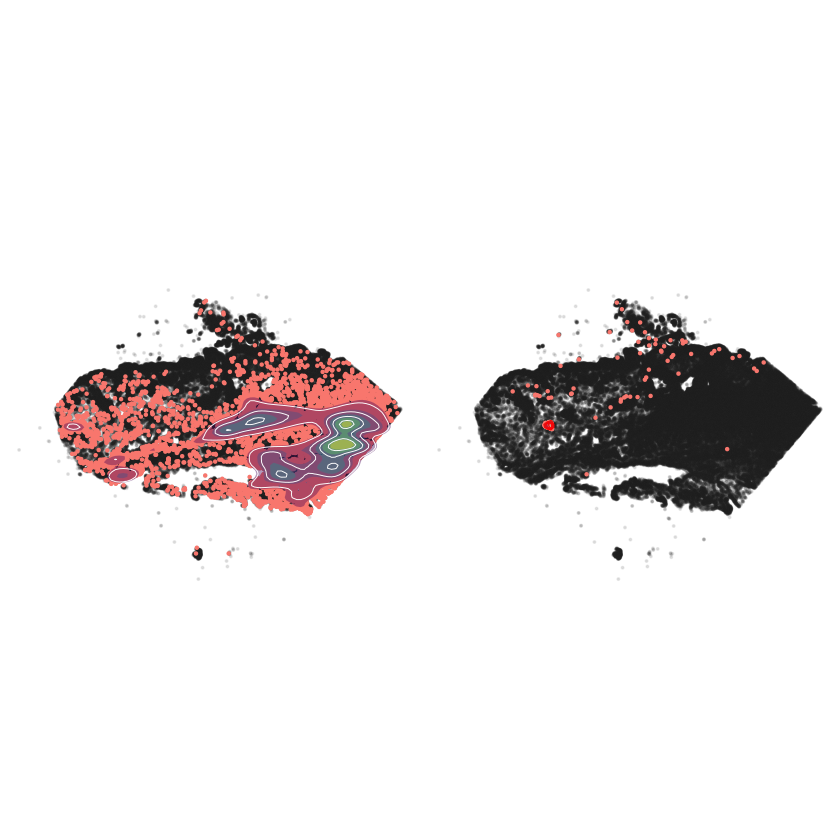

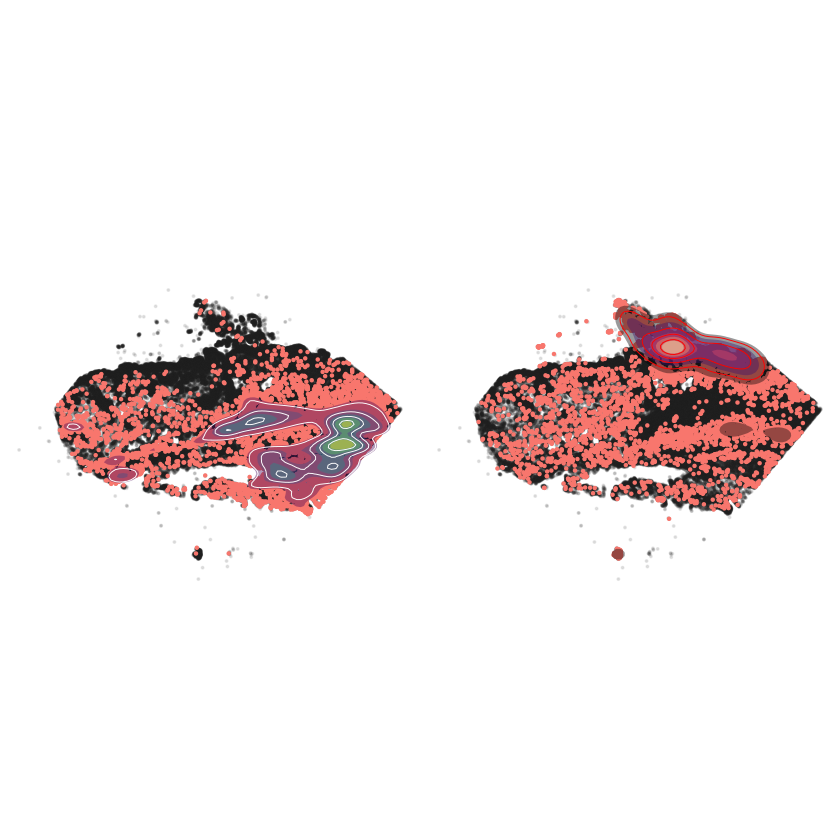

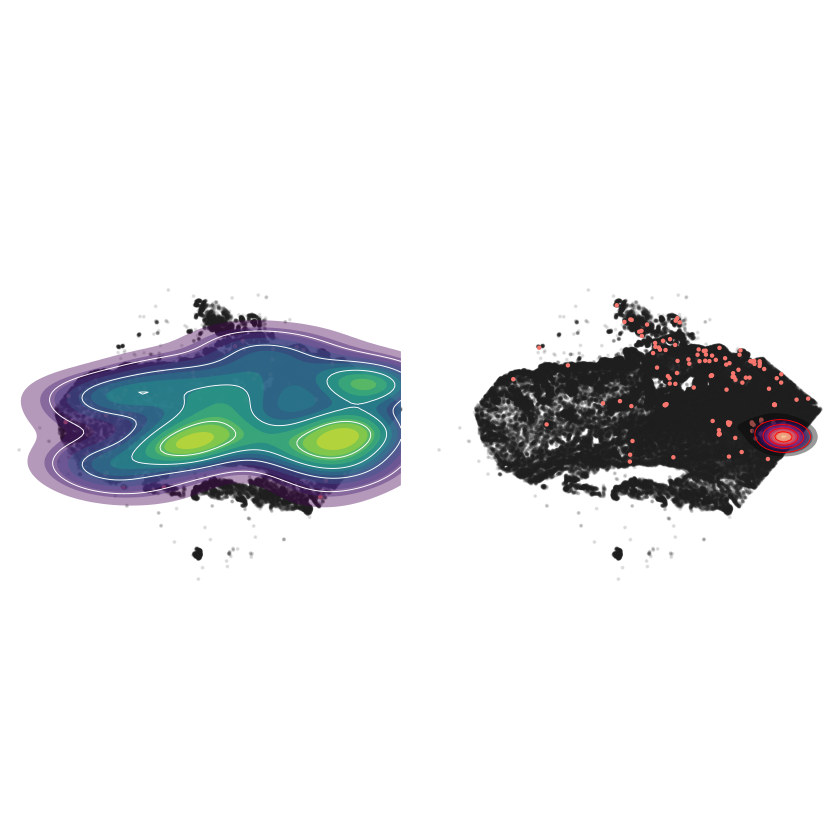

     进度: 40 / 703



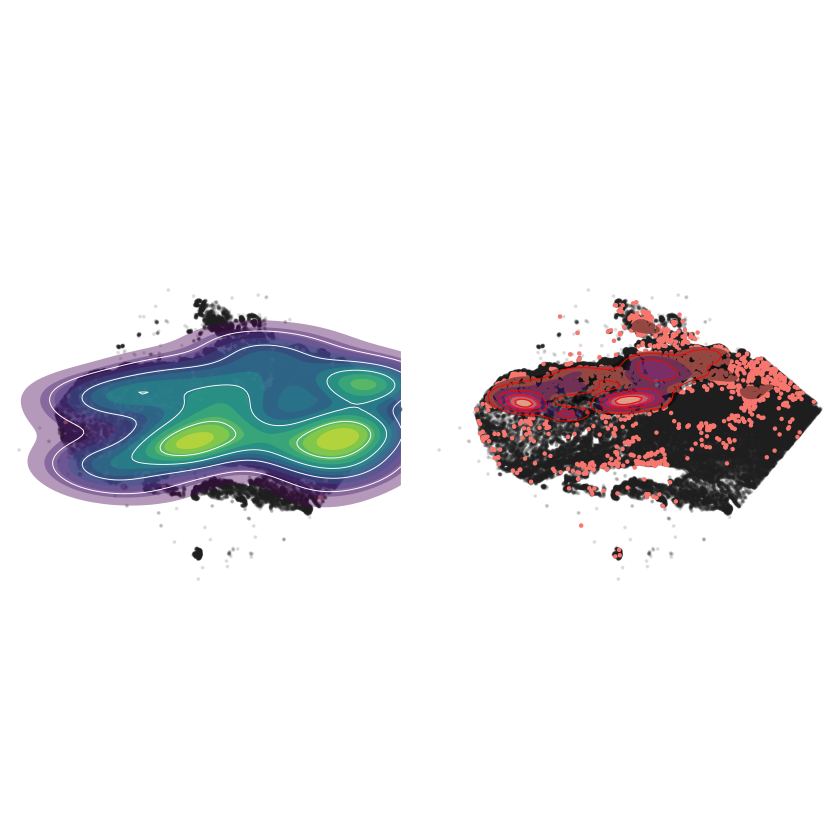

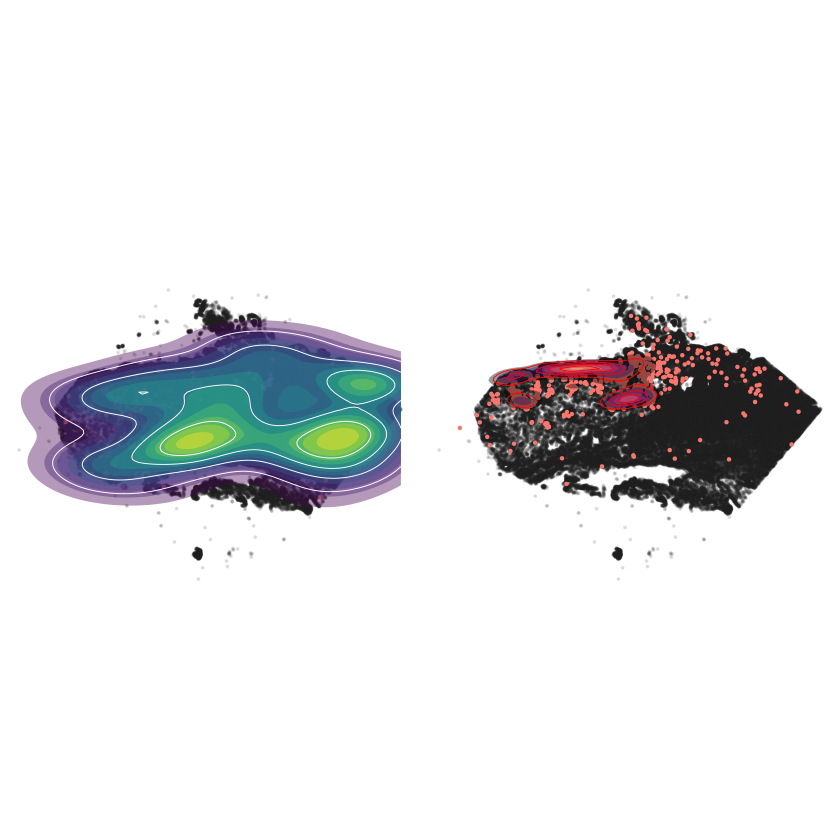

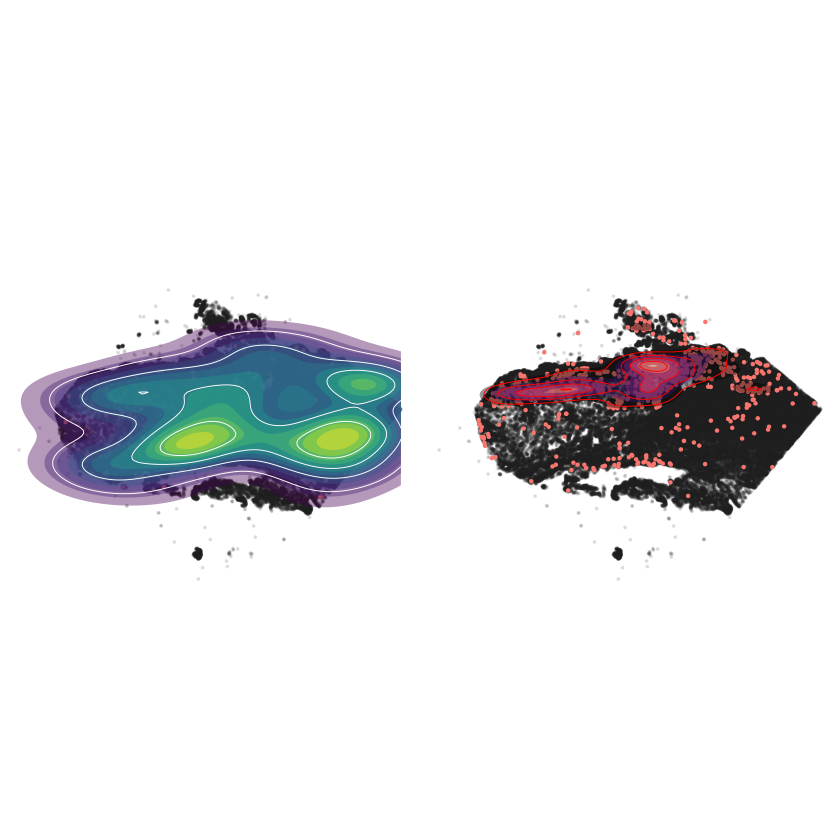

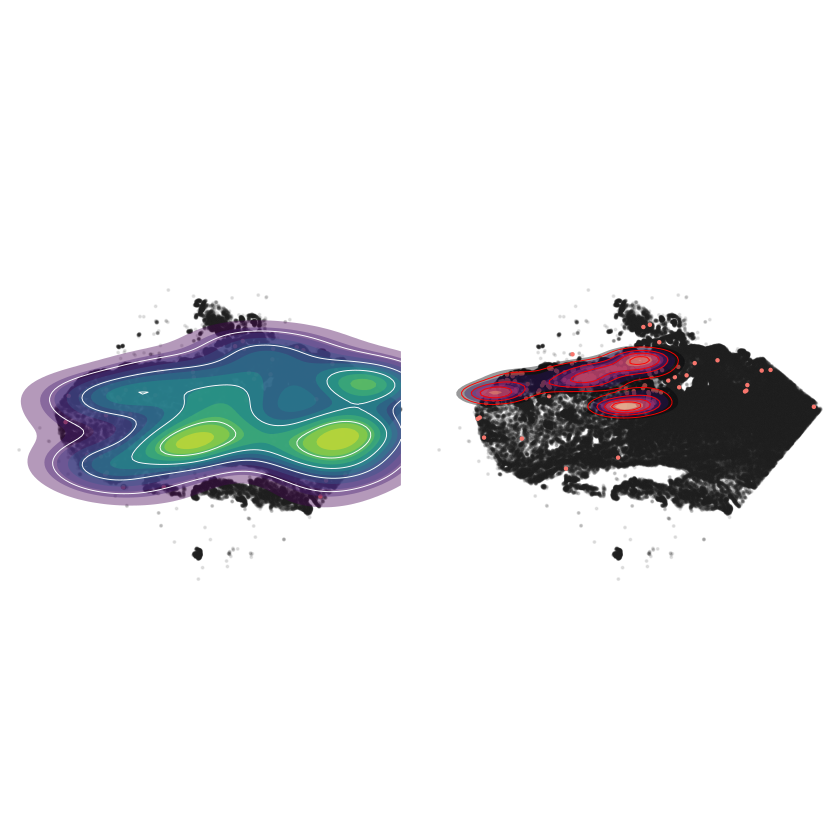

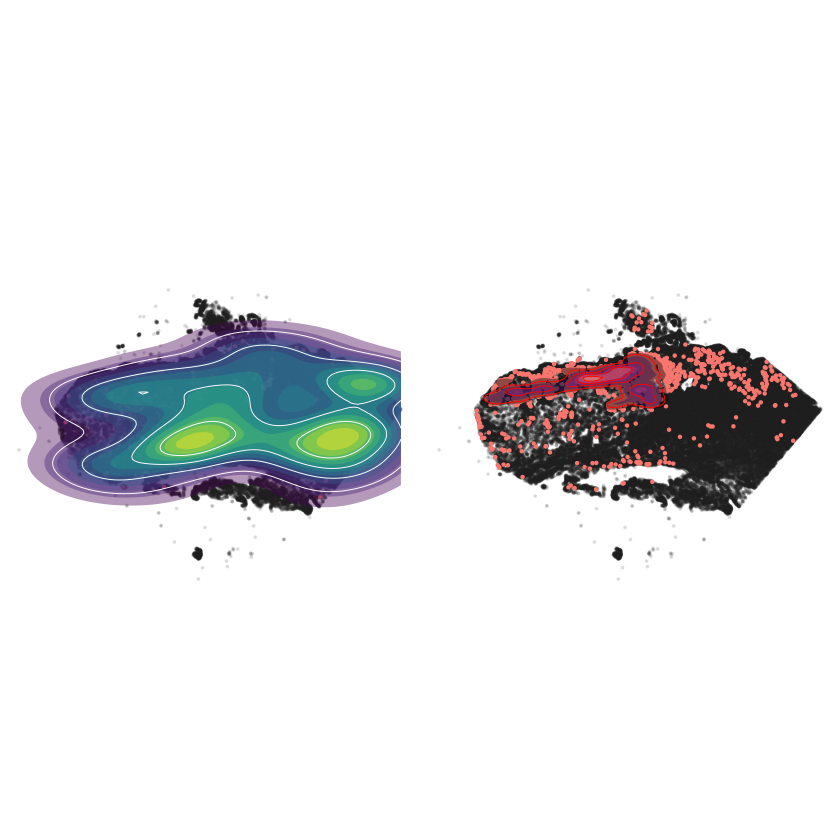

...

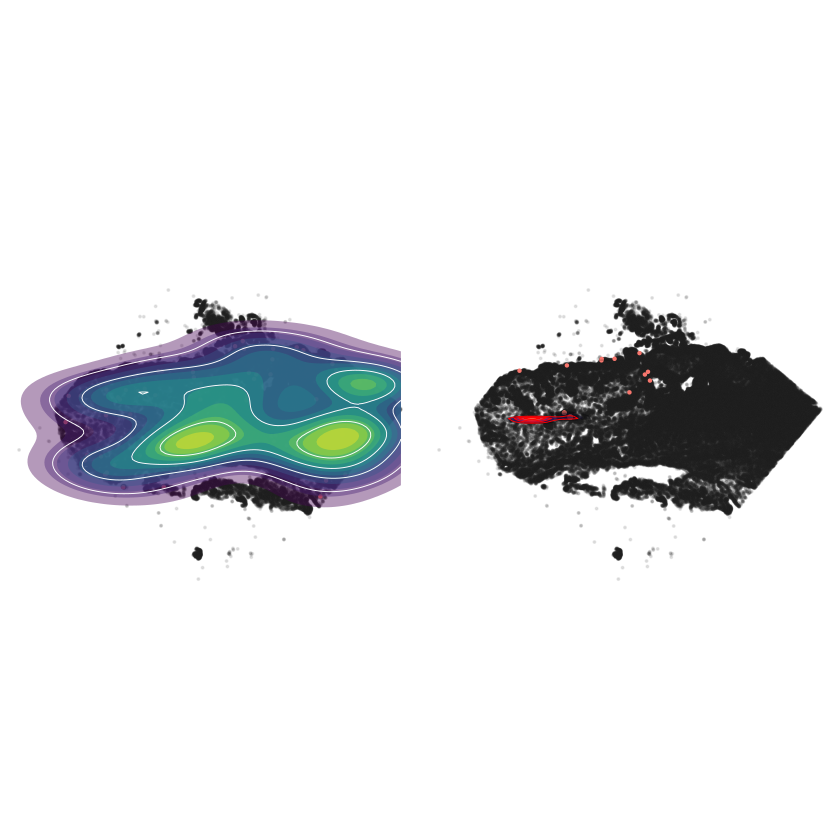

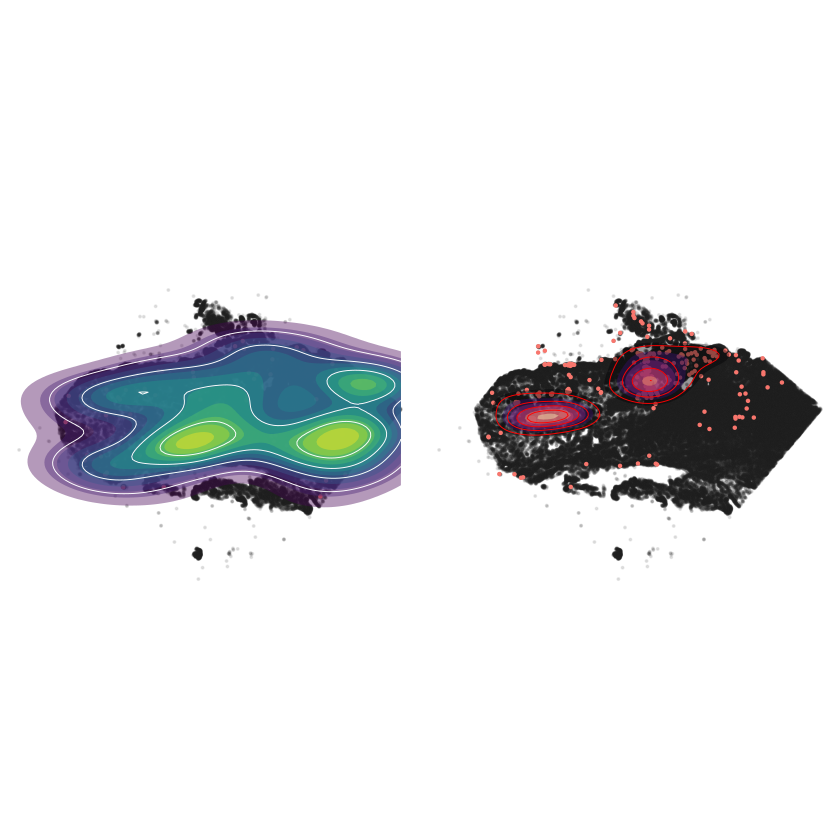

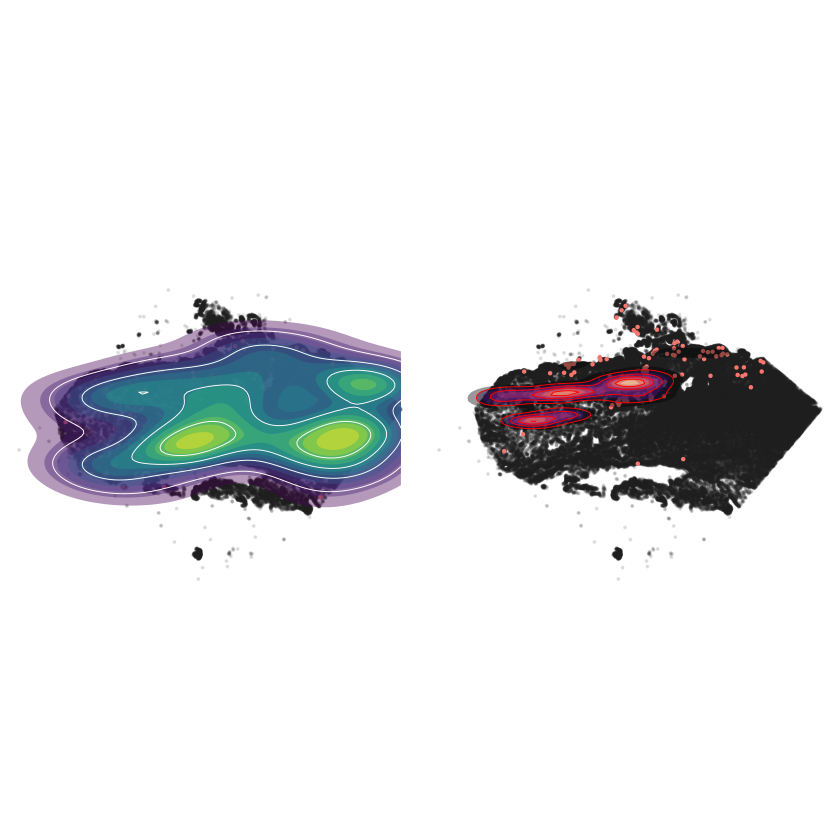

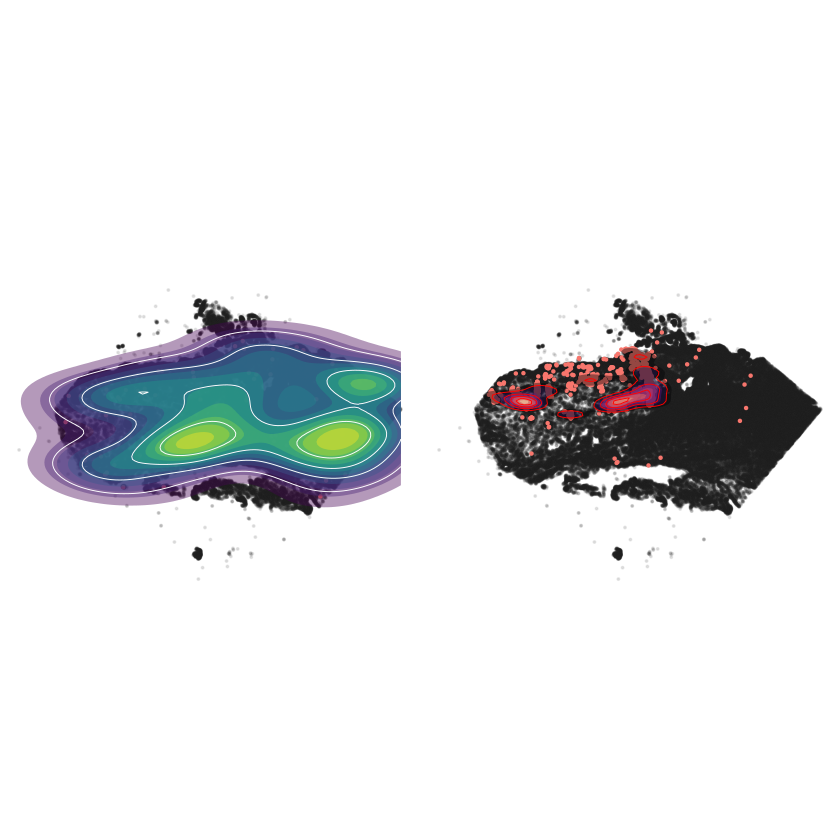

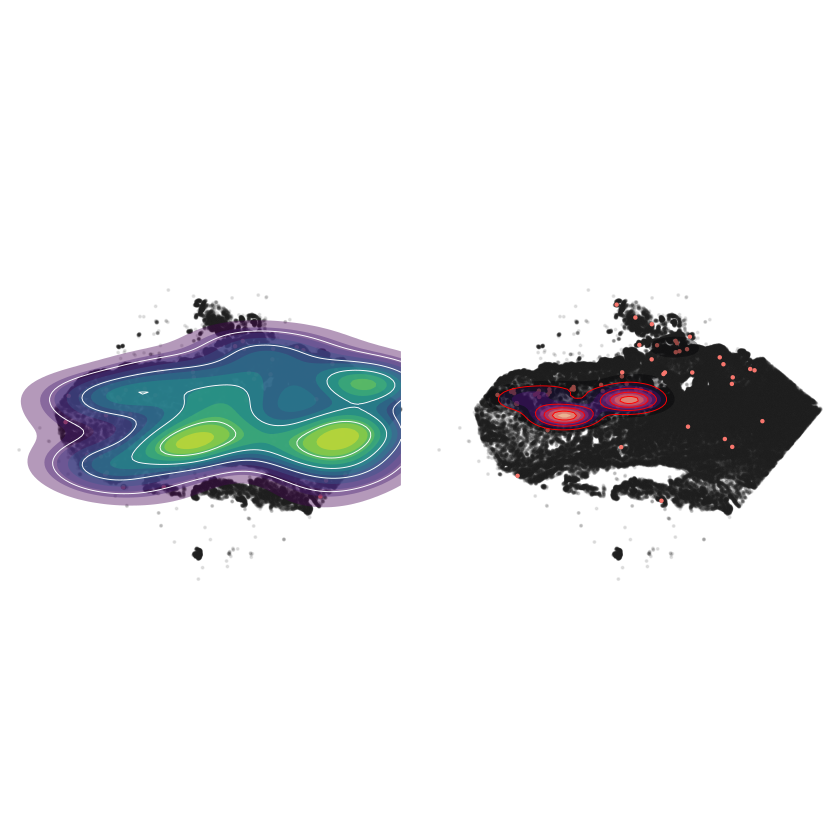

     进度: 60 / 703



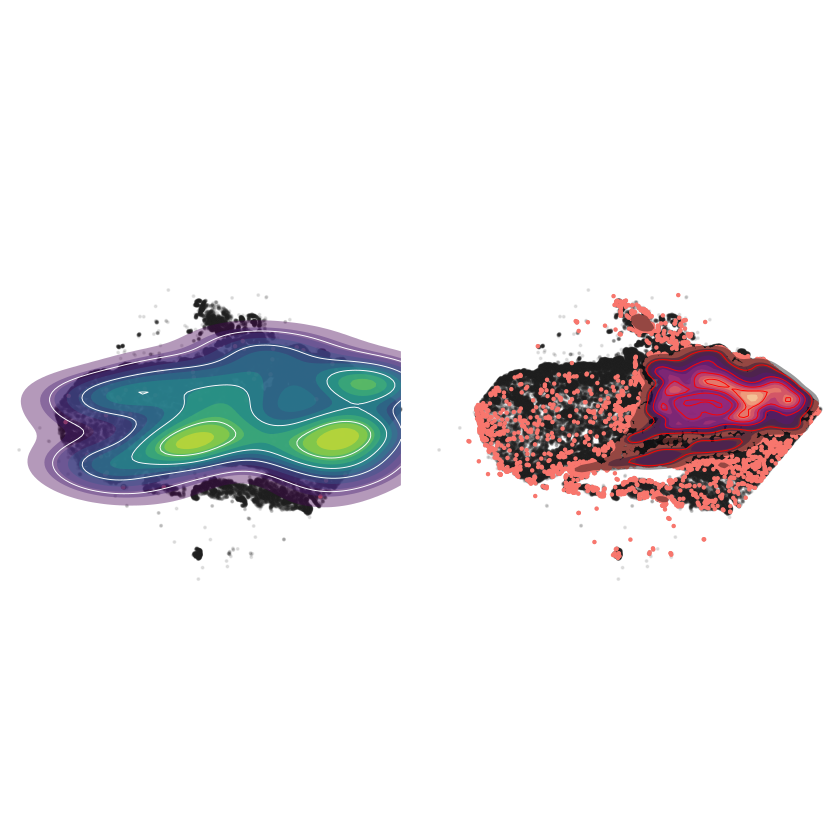

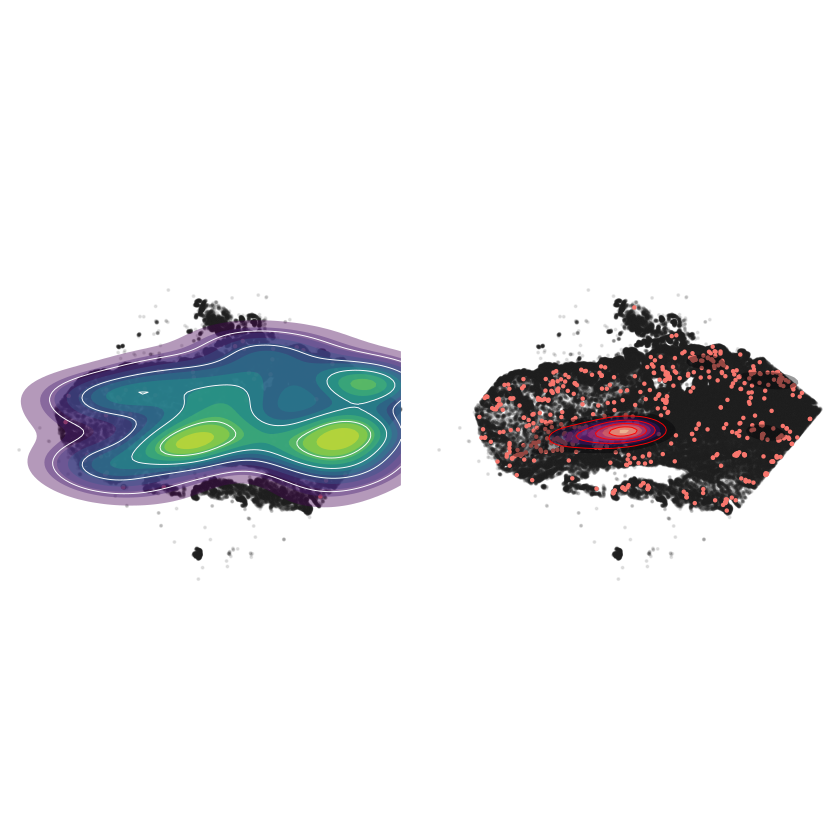

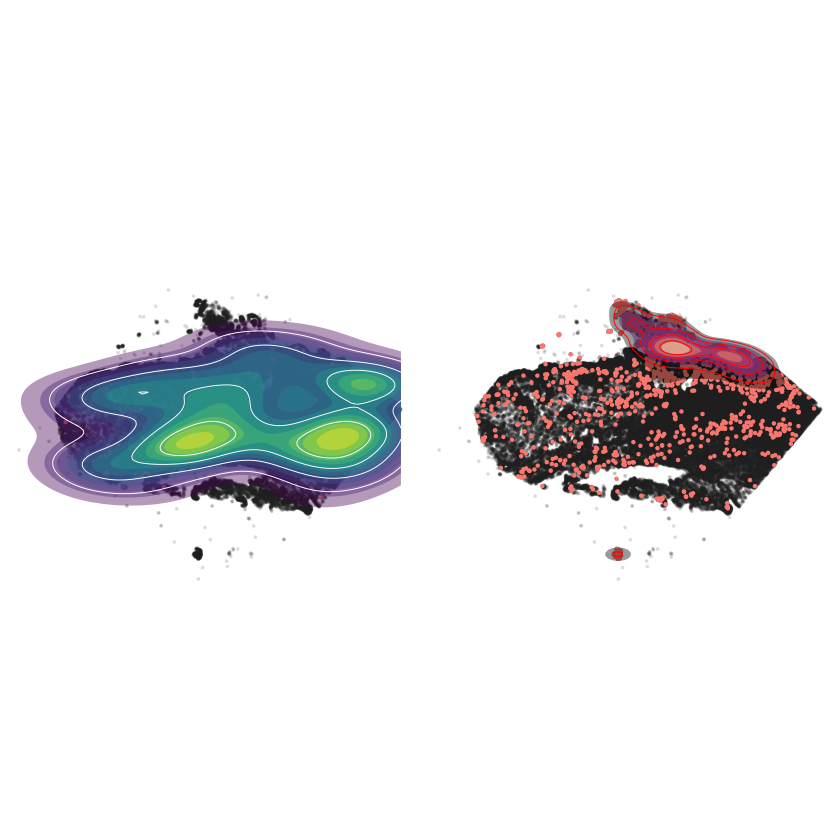

In [ ]:
# ================= 0. 环境设置与库加载 =================
library(ggplot2)
library(dplyr)
library(viridis)
library(gridExtra)
library(cowplot)
library(stringr)

# --- 定义路径 ---
# 请根据你的实际情况确认这些路径是否正确
enrichment_dir <- "/data/work/02.result/colocalization_20251226/py" # 你的 enrichment.csv 所在路径
meta_dir <- "/data/work/02.result/colocalization_20251226/sp_meta"    # 你的空间坐标 meta 所在路径
output_dir <- "/data/work/02.result/colocalization_20251226/R/plots"  # 结果保存路径

# 创建输出目录
if(!dir.exists(output_dir)) dir.create(output_dir, recursive = TRUE)
setwd(output_dir)

# --- 定义黑色背景主题 ---
black_theme <- function() {
  theme(
    panel.background = element_rect(fill = "black", color = NA),
    plot.background = element_rect(fill = "black", color = "black"),
    legend.background = element_rect(fill = "black"),
    legend.box.background = element_rect(fill = "black", color = NA),
    panel.grid = element_blank(),
    axis.line = element_line(linewidth = 0.5, color = "white"),
    axis.text = element_text(size = 12, color = "white"),
    axis.title = element_text(size = 14, color = "white"),
    legend.title = element_text(size = 12, color = "white"),
    legend.text = element_text(size = 10, color = "white"),
    plot.title = element_text(size = 16, color = "white", hjust = 0.5),
    legend.position = "right",
    legend.key = element_rect(fill = "black", color = NA)
  )
}

# ================= PART 1. 批量绘制气泡图 (Bubble Plot) =================
message(">>> PART 1: 开始绘制气泡图...")

enrich_files <- list.files(enrichment_dir, pattern = "_enrichment.csv", full.names = TRUE)

for (file in enrich_files) {
  
  # 1. 读取与解析文件名
  df <- read.csv(file, row.names = 1, stringsAsFactors = FALSE)
  fn <- basename(file)
  sample_id <- str_remove(fn, "_enrichment.csv")
  
  # 2. 数据清洗
  # 截断 Log2FC (-3 到 3)
  df$Log2FC[df$Log2FC > 3] <- 3
  df$Log2FC[df$Log2FC < -3] <- -3
  
  # 计算 -log10 Pvalue 并截断
  df$neglogP <- -log10(df$Pvalue + 1e-300)
  df$neglogP[df$neglogP > 20] <- 20 
  
  # 3. 筛选数据 (只保留 P < 0.05 的显著点，避免图太乱)
  plot_df <- df %>% filter(Pvalue < 0.05)
  
  if (nrow(plot_df) == 0) {
    message(paste("  -> [跳过]", sample_id, "无显著结果"))
    next
  }
  
  # 4. 绘图
  p <- ggplot(plot_df, aes(x = To, y = From, color = Log2FC, size = neglogP)) + 
    geom_point() + 
    # 使用 inferno/magma 风格的配色 (Option B)
    scale_color_viridis(option = "B", begin = 0.2, end = 0.9, limits=c(-3, 3)) + 
    theme_bw() +
    labs(title = paste("Spatial Enrichment:", sample_id), 
         x = "Neighbor Cell Type", y = "Center Cell Type",
         color = "Log2FC", size = "-log10(P)") +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    black_theme()
  
  # 5. 保存 PDF
  ggsave(plot = p, filename = paste0(sample_id, "_Bubble.pdf"), width = 10, height = 8)
  message(paste("  -> [完成]", sample_id, "气泡图"))
}


# ================= PART 2. 批量绘制全排列轮廓图 (Contour Plot) =================
message("\n>>> PART 2: 开始绘制全排列空间密度轮廓图...")

# 定义 Contour 图的保存根目录
contour_base_dir <- file.path(output_dir, "Contour_Plots")
if(!dir.exists(contour_base_dir)) dir.create(contour_base_dir)

# 获取所有 meta 文件
meta_files <- list.files(meta_dir, pattern = "_meta.csv", full.names = TRUE)

for (meta_f in meta_files) {
  
  # --- 1. 读取数据 ---
  fn <- basename(meta_f)
  # 解析 Sample ID (假设文件名如 M1_D14-anno_meta.csv)
  stage <- str_split(fn, "-")[[1]][1] 
  
  message(paste("正在处理芯片:", stage))
  
  # 为该芯片创建独立子文件夹
  sample_out_dir <- file.path(contour_base_dir, stage)
  if(!dir.exists(sample_out_dir)) dir.create(sample_out_dir)
  
  # 读取 metadata
  meta_df <- read.csv(meta_f, row.names = 1, stringsAsFactors = FALSE)
  
  # 准备绘图数据
  coord <- data.frame(
    x = meta_df$x_adjust,
    y = meta_df$y_adjust,
    celltype = meta_df$pred_celltype
  )
  
  # --- 2. 生成组合 ---
  # 过滤掉细胞数量太少的类型（<10个无法画密度图）
  cell_counts <- table(coord$celltype)
  valid_celltypes <- names(cell_counts[cell_counts > 10])
  
  if (length(valid_celltypes) < 2) {
    warning(paste("  ->", stage, "有效细胞类型不足2种，无法配对"))
    next
  }
  
  # 生成所有两两组合 (C_n^2)
  combos <- combn(valid_celltypes, 2)
  total_plots <- ncol(combos)
  
  message(paste("  -> 有效细胞类型:", length(valid_celltypes), "| 组合总数:", total_plots))
  
  # --- 3. 循环绘图 ---
  for (i in 1:total_plots) {
    
    ct1 <- combos[1, i]
    ct2 <- combos[2, i]
    
    # 定义文件名 (使用 JPG 以节省空间和加快速度)
    out_name <- file.path(sample_out_dir, paste0(stage, "_", ct1, "_vs_", ct2, ".jpg"))
    
    # 如果文件已存在，跳过 (断点续传)
    if (file.exists(out_name)) next 
    
    # --- 绘图函数 (内部使用 tryCatch 防止单张报错中断循环) ---
    tryCatch({
      
      # [左图] 细胞 1
      p1 <- ggplot(coord, aes(x = x, y = y)) +
        # 背景：所有细胞，深灰，高透明
        geom_point(color = "#222222", size = 0.05, alpha = 0.1) + 
        # 前景：目标细胞
        geom_point(data = coord[coord$celltype == ct1, ], aes(color = celltype), size = 0.2, show.legend = FALSE) +
        # 密度填充
        stat_density_2d(data = coord[coord$celltype == ct1, ], 
                        aes(fill = ..level..), geom = "polygon", alpha = 0.4, show.legend = FALSE) +
        # 密度线
        geom_density_2d(data = coord[coord$celltype == ct1, ], 
                        color = "white", linewidth = 0.2, bins = 5) +
        scale_fill_viridis() + 
        coord_fixed() +
        theme_void() + # 去除坐标轴，纯净模式
        labs(title = ct1) +
        theme(plot.title = element_text(color="white", hjust=0.5, size=12, face="bold"))
      
      # [右图] 细胞 2
      p2 <- ggplot(coord, aes(x = x, y = y)) +
        geom_point(color = "#222222", size = 0.05, alpha = 0.1) + 
        geom_point(data = coord[coord$celltype == ct2, ], aes(color = celltype), size = 0.2, show.legend = FALSE) +
        stat_density_2d(data = coord[coord$celltype == ct2, ], 
                        aes(fill = ..level..), geom = "polygon", alpha = 0.4, show.legend = FALSE) +
        geom_density_2d(data = coord[coord$celltype == ct2, ], 
                        color = "red", linewidth = 0.2, bins = 5) +
        scale_fill_viridis(option = "magma") +
        coord_fixed() +
        theme_void() +
        labs(title = ct2) +
        theme(plot.title = element_text(color="white", hjust=0.5, size=12, face="bold"))
      
      # [组合并添加黑底]
      g <- grid.arrange(p1, p2, nrow = 1)
      p_final <- cowplot::ggdraw(g) + 
        theme(plot.background = element_rect(fill = "black", color = NA))
      
      # 保存图片 (dpi=150 适合快速预览大量图片)
      ggsave(plot = p_final, filename = out_name, width = 10, height = 5, dpi = 150)
      
    }, error = function(e) {
      message(paste("     [Error]", ct1, "vs", ct2, ":", e$message))
    })
    
    # 进度提示
    if (i %% 20 == 0) message(paste("     进度:", i, "/", total_plots))
  }
}

message("\n✅ 所有分析与绘图任务全部完成！")